In [1]:
# import standard libraries YOUR LIBRARIES HERE
import pandas as pd 
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.subplots as subplots
import plotly.graph_objects as go

# import Sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split # Splitting the data set
from sklearn.preprocessing import MinMaxScaler, StandardScaler # Normalization and standard scaler
from sklearn.preprocessing import LabelEncoder, OneHotEncoder # Label and 1-hot encoding
from sklearn.linear_model import LinearRegression # Linear regression model
from sklearn.preprocessing import PolynomialFeatures # Polynomial features
from sklearn.linear_model import Ridge # Ridge model
from sklearn.linear_model import RidgeCV # Ridge with cross validation
from sklearn.linear_model import ElasticNet # ElasticNet model
from sklearn.linear_model import LogisticRegression # Logistic regression model
from sklearn.linear_model import LogisticRegressionCV # Logistic regression with cross-validation
from sklearn.neighbors import KNeighborsClassifier # KNN Algorithm
from sklearn.model_selection import GridSearchCV   # Grid search for cross validation
from sklearn.tree import DecisionTreeClassifier, plot_tree # Decision Trees
from sklearn.metrics import accuracy_score  # Accuracy
from sklearn.metrics import confusion_matrix # Confusion matrix
from sklearn.metrics import precision_score, recall_score, f1_score  # Precision, recall, and f1 score
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score # Metrics for errors

# Assignment 1 

Welcome to the assignment! 

You will have to implement regression and classification algorithms, applying these methods to the topics of agriculture, food, water, and health. More precisely, you will try to:
- predict crop yields using data on weather and fertilizer use;
- predict the potability of water using data on the mineral and micro-organisms content of water.

Once you are done you have to submit your notebook here: 
[https://moodle.epfl.ch/mod/assign/view.php?id=1244180](https://moodle.epfl.ch/mod/assign/view.php?id=1244180)

If there is need for further clarifications on the questions, after the assignment is released, we will update this file, so make sure you check the git repository for updates.

Good luck!

## Linear regression: predicting crop yields

In 2020, between 720 million and 811 million persons worldwide were suffering from hunger (see [SDG Goal 2](https://www.un.org/sustainabledevelopment/hunger/) Zero Hunger). Given the ongoing growth of the world population, it is imperative to comprehend crop yield at a global level in order to tackle food security issues and mitigate the effects of climate change.

The Agricultural yield depends on weather conditions (rain, temperature, etc) and fertilizers use. Having precise information regarding the historical crop yield is critical for making informed decisions regarding agricultural risk management and future projections.

Some E4S publications on the topic of food:
- [Threats to Nitrogen Fertilizer, Opportunities to Cultivate Sustainable Practices?](https://e4s.center/resources/reports/threats-to-nitrogen-fertilizer-opportunities-to-cultivate-sustainable-practices/)
- [True cost of food as a lever to transform the Swiss food system](https://e4s.center/resources/reports/true-cost-of-food-as-a-lever-to-transform-the-swiss-food-system/)

<img src='https://upload.wikimedia.org/wikipedia/commons/thumb/b/b7/Sustainable_Development_Goal_02ZeroHunger.svg/800px-Sustainable_Development_Goal_02ZeroHunger.svg.png' width="200">

We will use data obtained from the [FAO](http://www.fao.org/home/en/) (Food and Agriculture Organization) and [World Data Bank](https://data.worldbank.org/), and gathered in the [Crop Yield Prediction Dataset](https://www.kaggle.com/datasets/patelris/crop-yield-prediction-dataset).

Our goal is to predict the crop yields using the temperature, rain fall, and type of crops.


### Question 1: Load and Discover the dataset

- Load the data in a dataframe. The url link is provided below. Display the first 10 observations and the types of data **1 point**

In [2]:
# I couldn't acess the raw github content and therefore created my own directory path
#project_dir = r"C:\Users\Charlotte Ahrens\Documents\Personal\GitHub\MGT-502-Data-Science-and-Machine-Learning\data"

In [3]:
# access and display data
url_yield = 'https://raw.githubusercontent.com/michalis0/MGT-502-Data-Science-and-Machine-Learning/main/data/yield_df.csv'
#url_yield = os.path.join(project_dir,"yield_df.csv")
crop = pd.read_csv(url_yield)
display(crop.head(10))

,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
0,Albania,Maize,1990,36613,1485,121.0,16.37
1,Albania,Potatoes,1990,66667,1485,121.0,16.37
2,Albania,"Rice, paddy",1990,23333,1485,121.0,16.37
3,Albania,Sorghum,1990,12500,1485,121.0,16.37
4,Albania,Soybeans,1990,7000,1485,121.0,16.37
5,Albania,Wheat,1990,30197,1485,121.0,16.37
6,Albania,Maize,1991,29068,1485,121.0,15.36
7,Albania,Potatoes,1991,77818,1485,121.0,15.36
8,Albania,"Rice, paddy",1991,28538,1485,121.0,15.36
9,Albania,Sorghum,1991,6667,1485,121.0,15.36


- Print the list of countries ('Area') and years available in the dataset **1 point**

In [4]:
print(np.unique(crop["Area"].values.tolist()))
print(np.unique(crop["Year"].values.tolist()))

print("The total # of countries is: %g" %len(np.unique(crop["Area"].values.tolist()))) 
print("The time period ranges from: %s to %s." %(min(np.unique(crop["Year"].values.tolist())),max(np.unique(crop["Year"].values.tolist()))))

['Albania' 'Algeria' 'Angola' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Belarus' 'Belgium'
 'Botswana' 'Brazil' 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cameroon'
 'Canada' 'Central African Republic' 'Chile' 'Colombia' 'Croatia'
 'Denmark' 'Dominican Republic' 'Ecuador' 'Egypt' 'El Salvador' 'Eritrea'
 'Estonia' 'Finland' 'France' 'Germany' 'Ghana' 'Greece' 'Guatemala'
 'Guinea' 'Guyana' 'Haiti' 'Honduras' 'Hungary' 'India' 'Indonesia' 'Iraq'
 'Ireland' 'Italy' 'Jamaica' 'Japan' 'Kazakhstan' 'Kenya' 'Latvia'
 'Lebanon' 'Lesotho' 'Libya' 'Lithuania' 'Madagascar' 'Malawi' 'Malaysia'
 'Mali' 'Mauritania' 'Mauritius' 'Mexico' 'Montenegro' 'Morocco'
 'Mozambique' 'Namibia' 'Nepal' 'Netherlands' 'New Zealand' 'Nicaragua'
 'Niger' 'Norway' 'Pakistan' 'Papua New Guinea' 'Peru' 'Poland' 'Portugal'
 'Qatar' 'Romania' 'Rwanda' 'Saudi Arabia' 'Senegal' 'Slovenia'
 'South Africa' 'Spain' 'Sri Lanka' 'Sudan' 'Suriname' 'Sweden'
 'Switzerland' 'Tajikistan

- Print the list of 'Item' in the dataset. You should obtain a list of 10 crops, which are among the most consumed in the world **1 point**

In [5]:
print(np.unique(crop["Item"].values.tolist()))
print(" # of the most consumed crops worldwide: %g" %(len(np.unique(crop["Item"].values.tolist()))))


['Cassava' 'Maize' 'Plantains and others' 'Potatoes' 'Rice, paddy'
 'Sorghum' 'Soybeans' 'Sweet potatoes' 'Wheat' 'Yams']
 # of the most consumed crops worldwide: 10


- Display summary statistics for the columns: 'hg/ha_yield', 'average_rain_fall_mm_per_year', 'pesticides_tonnes','avg_temp'. How many observations do we have? **1 point**

*Hint:* You can extract the columns 'hg/ha_yield', 'average_rain_fall_mm_per_year', 'pesticides_tonnes','avg_temp' in a new dataframe since we will reuse it in the following questions

In [6]:
crop_main = crop.loc[:,['hg/ha_yield','average_rain_fall_mm_per_year', 'pesticides_tonnes','avg_temp']]
display(crop_main.describe())
print("There a %g observations." %crop_main.describe().iloc[0,0])

,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
count,28242.000000,28242.00000,28242.000000,28242.000000
mean,77053.332094,1149.05598,37076.909344,20.542627
std,84956.612897,709.81215,59958.784665,6.312051
min,50.000000,51.00000,0.040000,1.300000
25%,19919.250000,593.00000,1702.000000,16.702500
50%,38295.000000,1083.00000,17529.440000,21.510000
75%,104676.750000,1668.00000,48687.880000,26.000000
max,501412.000000,3240.00000,367778.000000,30.650000


There a 28242 observations.


- Display a heatmap of the correlation matrix between the columns: 'hg/ha_yield', 'average_rain_fall_mm_per_year', 'pesticides_tonnes','avg_temp' **1 point**

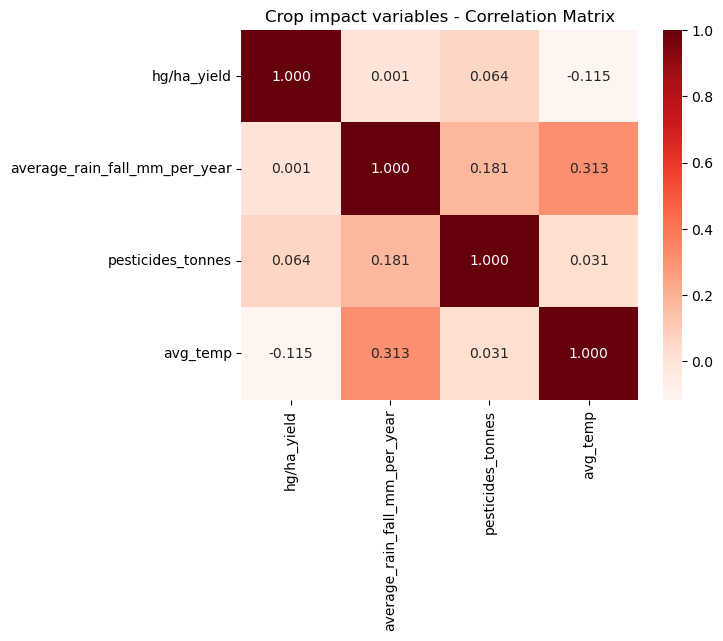

In [7]:
# calculate correlation betweeen yield, rainfall, pesticides, and temperature
crop_main_corr = crop_main.corr()
# plot heatmap
crop_main_heatmap = sns.heatmap(
    data = crop_main_corr,
    cmap= "Reds",
    annot = True,
    fmt = ".3f"
)
plt.title("Crop impact variables - Correlation Matrix");

- Create a boxplot of the columns: 'hg/ha_yield', 'average_rain_fall_mm_per_year', 'pesticides_tonnes','avg_temp' **1 point**

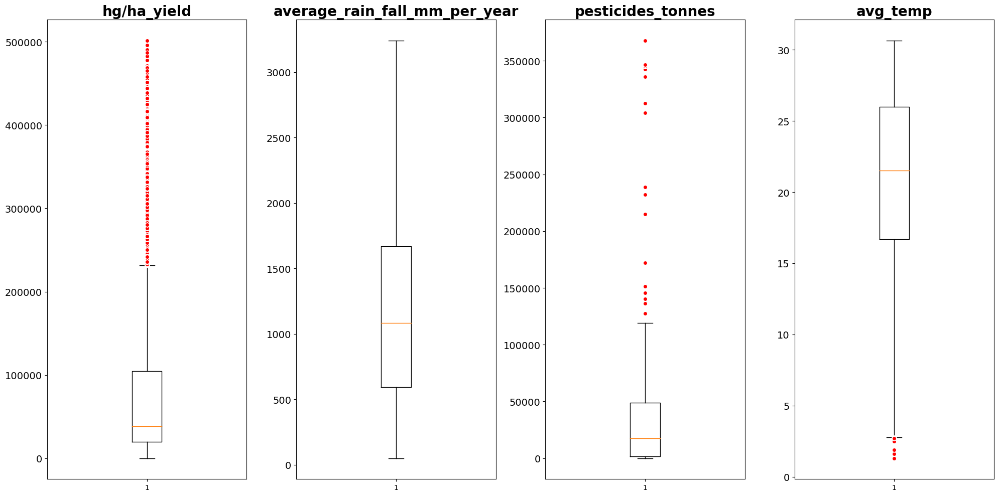

In [8]:
#create subplots for each column with its own scale
red_circle = dict(markerfacecolor= "red", marker="o", markeredgecolor="white")
fig, axs = plt.subplots(1, len(crop_main.columns), figsize=(20,10))

for i, ax in enumerate(axs.flat):
    ax.boxplot(crop_main.iloc[:,i], flierprops= red_circle)
    ax.set_title(crop_main.columns[i], fontsize=20, fontweight= "bold")
    ax.tick_params(axis="y", labelsize=14)

plt.tight_layout()

- Create a pairplot of the columns: 'hg/ha_yield', 'average_rain_fall_mm_per_year', 'pesticides_tonnes','avg_temp' **1 point**

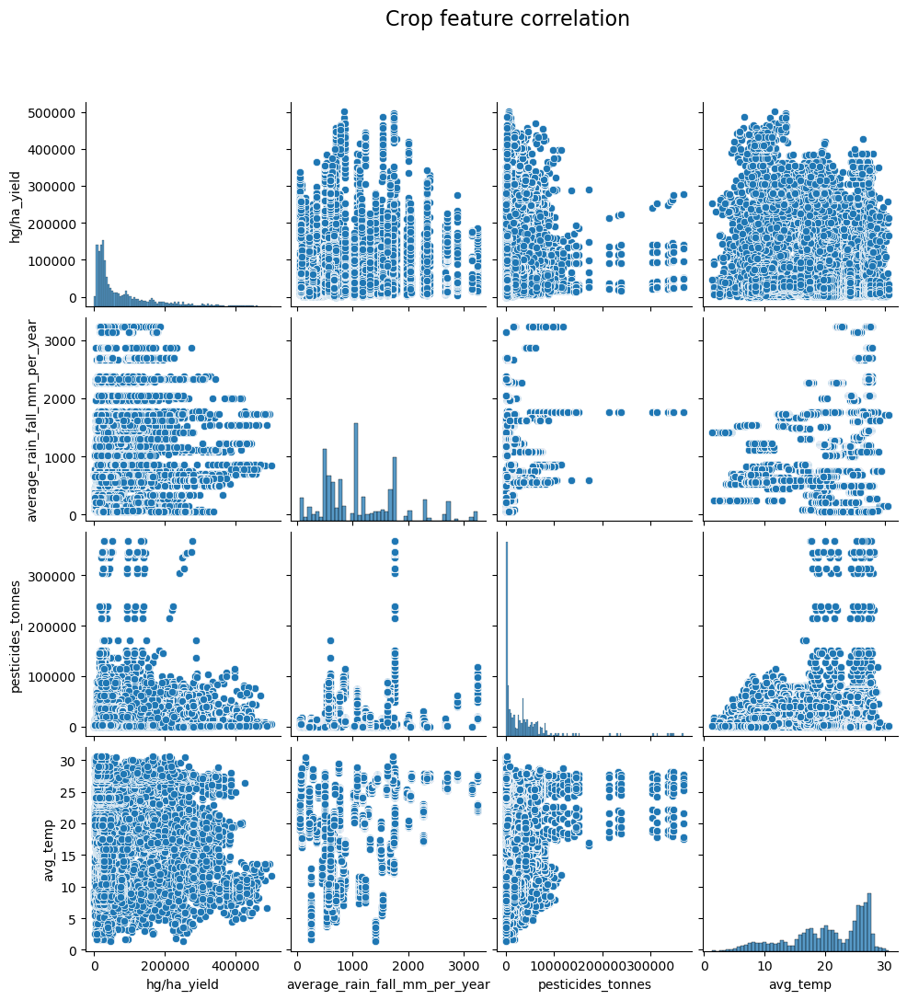

In [9]:
#plot the graph
crop_main_pair = sns.pairplot(
    crop_main
)
plt.title("Crop feature correlation", fontsize = 16, y=4.5, x= -1)

plt.show()

- Feel free to pursue your exploration to better understand your dataset. Although not graded, this might help you better understanding the problem and answer the following questions.

In [10]:
# crops ranked descending on their yield 
crop_items = crop.groupby(["Item"])["hg/ha_yield"].mean()
display(crop_items.sort_values(ascending=False))

# crops ranked descending on their year
top5_crops = ["Potatoes", "Cassava", "Sweet potatoes", "Yams","Plantains and others"]
crop_time = crop.groupby(["Year"])["hg/ha_yield"].mean()

# top 5 crops development over the time period 
crop_top5 = crop[crop["Item"].isin(top5_crops)]
crop_top5 = crop_top5.loc[:,["Item","Year","hg/ha_yield"]]
crop_top5_pivot = crop_top5.pivot_table(index='Item', columns='Year', values='hg/ha_yield')
display(crop_top5_pivot)

# plot the crop development
fig = go.Figure()

for row in crop_top5_pivot.iterrows():
    fig.add_trace(go.Scatter(x=crop_top5_pivot.columns.values, y= row[1].values, name = row[0]))

fig.update_layout(title = "Top 5 crop development from 1990 - 2013", 
                  xaxis_title = "Year",
                  yaxis_title = "Yield [hg/ha]",
                  legend_title = "Type of crop")
fig.show()

                                                         

Item
Potatoes                199801.549579
Cassava                 150479.466993
Sweet potatoes          119057.793772
Yams                    114140.345927
Plantains and others    106041.320144
Rice, paddy              40730.434770
Maize                    36310.070614
Wheat                    30116.267825
Sorghum                  18635.777229
Soybeans                 16731.092771
Name: hg/ha_yield, dtype: float64

Year,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Item,,,,,,,,,,,,,,,,,,,,,
Cassava,119292.738636,123852.761364,126751.516854,127019.561798,130528.955056,135052.123596,127985.494382,126310.359551,135821.213483,137388.707865,...,152541.280899,159912.910112,166888.910112,166105.898876,173298.707865,177385.235955,177227.988764,180969.752809,187967.213483,183037.134831
Plantains and others,107239.208333,108768.708333,103993.291667,105399.375000,105555.750000,108046.000000,103516.708333,103477.500000,104212.583333,105620.250000,...,106927.583333,106305.875000,102924.333333,106365.291667,104510.208333,113246.208333,104131.920000,106512.240000,109174.760000,110061.400000
Potatoes,173127.063953,169009.000000,171164.989130,174366.843243,175015.697297,179542.600000,183527.491892,186404.416216,182332.556757,192202.324324,...,211965.696809,210832.510638,206951.984127,214021.021164,218294.370370,221428.148148,223711.698413,232063.037037,225577.905759,234353.722513
Sweet potatoes,105421.804878,105426.065041,108816.838710,106974.040000,112618.976000,109643.448000,108298.784000,113712.690476,113724.436508,114306.214286,...,124440.857143,122462.992063,120313.452381,127342.309524,125774.515873,125629.936508,129093.611111,132829.944444,134179.437500,139882.539062
Yams,102800.228571,103059.083333,102729.944444,101499.500000,106840.111111,107747.750000,106690.388889,109758.540541,108553.405405,114722.567568,...,119684.216216,118905.486486,121788.756757,121928.864865,121021.621622,120880.702703,124828.810811,122860.459459,120183.282051,121000.205128


First, it shows that the most consumed crop worldwide are potatoes, followed by Cassava and Sweet potatoes. Furthermore, the graph clearly shows the increase in yield for each hectogram per hectar [hg/ha]. This trend might be explained through improved farming techniques including technology, more sustainable farming, or maybe also increase in pesticides?

Therefore, let's take a closer look on the pesticides development.

In [11]:
# top 5 crop pesticide development over the time period 
crop_top5 = crop[crop["Item"].isin(top5_crops)]
crop_pest = crop_top5.loc[:,["Item","Year","pesticides_tonnes"]]
crop_pest_pivot = crop_pest.pivot_table(index='Item', columns='Year', values='pesticides_tonnes')
display(crop_pest_pivot)

# plot the pesticide development
fig = go.Figure()

for row in crop_pest_pivot.iterrows():
    fig.add_trace(go.Scatter(x=crop_pest_pivot.columns.values, y= row[1].values, name = row[0]))

fig.update_layout(title = "Pesticide development for top 5 crops", 
                  xaxis_title = "Year",
                  yaxis_title = "Pesticides [tonnes]",
                  legend_title = "Pesticide for crop")
fig.show()

Year,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Item,,,,,,,,,,,,,,,,,,,,,
Cassava,30637.448977,31006.045114,31208.102472,31169.529888,31130.475955,32492.184494,32639.819101,33430.789213,34762.817865,35014.277079,...,44570.632584,48562.555618,49045.060787,56564.188764,53671.309101,59270.067753,64980.638202,68770.614382,68663.873933,69311.104831
Plantains and others,3733.668333,3504.404583,3550.210000,3345.622083,3448.172083,3803.496667,3761.202083,4222.462083,9529.623750,9027.380000,...,14403.139167,14349.644583,11613.923333,11492.492500,8849.312083,8096.936250,10614.852400,9110.837200,8227.218800,8255.060800
Potatoes,26320.742384,26145.009360,25256.023641,25175.152216,24949.691892,25996.040703,26733.999892,27823.776432,28713.145514,28929.071838,...,31761.682447,33878.165479,33310.385132,37595.223968,36611.521852,38693.303333,41536.786561,44024.690423,44014.018115,44169.230000
Sweet potatoes,30476.086992,30534.783902,30654.572661,30479.839200,30275.256640,31537.490160,32310.324320,33388.857143,34041.959286,34101.018016,...,38729.031190,41333.941984,41953.715476,47012.561905,45875.647619,49316.735714,53345.202619,56281.819444,55473.924063,55991.570312
Yams,31057.693429,32774.173889,35272.472500,37978.754167,40741.590278,43564.741111,46250.418889,47457.671892,52505.097027,55423.769189,...,80965.219189,86782.898919,87852.258378,105934.198649,106275.401351,113600.983243,114713.684054,114914.155405,109745.767436,115714.425897


The use of pesticides for these crops clearly increases as well. As yield increases the use of pesticides - especially for Yams increases Using more pesticides can cause pesticide resistance, meaning more and "stronger" pesticides are needed to prevent pests that are damaging the crop. In addition, pesticides kill also natural beneficial bacteria that keeps more harmful pests in check. Overall this phenomenon works similar to antibiotics for human beings.

Lastly, I will check if my boxplots change when rescaling a the data. Just for practice purposes.

In [12]:
# scale my variables in order to create a better boxplot 
scaler = MinMaxScaler()

#fit and transform my variable
crop_main_scaled = scaler.fit_transform(crop_main)
crop_main_scaled = pd.DataFrame(crop_main_scaled)

#rename the headers
header = ['hg/ha_yield','average_rain_fall_mm_per_year', 'pesticides_tonnes','avg_temp']
crop_main_scaled.columns = header
display(crop_main_scaled)

#redo the boplot: 
crop_main_box = px.box(
    data_frame= crop_main_scaled,
    y= ['hg/ha_yield', 'average_rain_fall_mm_per_year', 'pesticides_tonnes','avg_temp'],
    title= "Crop impact variables"
)
crop_main_box


,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
0,0.072927,0.449671,0.000329,0.513458
1,0.132872,0.449671,0.000329,0.513458
2,0.046439,0.449671,0.000329,0.513458
3,0.024832,0.449671,0.000329,0.513458
4,0.013862,0.449671,0.000329,0.513458
...,...,...,...,...
28237,0.044940,0.190028,0.006934,0.628961
28238,0.006016,0.190028,0.006934,0.628961
28239,0.026113,0.190028,0.006934,0.628961
28240,0.044224,0.190028,0.006934,0.628961


After the rescaling, I don't have access to the true value sizes in the boxplot, however the proportions stay the same and it is a good way to have an overall idea on how spread my data is.

### Question 2: Multivariate regression 

We will try to predict the crop yields (column 'hg/ha_yield') using as features: 'Item', 'average_rain_fall_mm_per_year', 'pesticides_tonnes','avg_temp'

- Extract your features and outcome **1 point**

In [13]:
X_c = crop[["Item","average_rain_fall_mm_per_year", "pesticides_tonnes","avg_temp"]]
y_c = crop["hg/ha_yield"]

- Split between training and test set **1 point**

*Note*: Use as option: `test_size=0.2`, `random_state=42`, `shuffle=True`

In [14]:
#train / test set split 80:20
X_c_train, X_c_test, y_c_train, y_c_test = train_test_split(X_c,y_c, test_size= 0.2, random_state=42, shuffle=True)


- Encode the column 'Item' using `LabelEncoder` **1 point**

*Note*: After training your encoder, you need to transform the values of both the training and test set

In [15]:
# encoding the strings in column "Item" to integers
display(X_c_train)
# extract column "Item"
Items = X_c_train[["Item"]].values.ravel()
Items_test = X_c_test[["Item"]].values.ravel()
display(Items)
# define the encoder
le = LabelEncoder()

# fit the encoder based on the train data
le.fit(Items)

# Transform the train and the test set
X_c_train = X_c_train.assign(Item = le.transform(Items))
X_c_test = X_c_test.assign(Item = le.transform(Items_test))

print(X_c_train[["Item"]])


,Item,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
5493,Sorghum,1604,829.59,25.36
10969,Soybeans,1083,70791.00,25.91
2001,Cassava,1292,484.59,25.81
22157,Potatoes,494,16936.00,23.76
311,Sweet potatoes,1010,40.00,24.41
...,...,...,...,...
21575,"Rice, paddy",151,31.00,29.46
5390,Plantains and others,1604,411.42,24.93
860,Potatoes,534,17866.00,18.73
15795,Sweet potatoes,832,74617.20,12.28


array(['Sorghum', 'Soybeans', 'Cassava', ..., 'Potatoes',
       'Sweet potatoes', 'Sweet potatoes'], dtype=object)

       Item
5493      5
10969     6
2001      0
22157     3
311       7
...     ...
21575     4
5390      2
860       3
15795     7
23654     7

[22593 rows x 1 columns]


- Rescale your features using `MinMaxScaler` **1 point**

In [16]:
#define scaler MinMaxScaler
scaler = MinMaxScaler()

#fit and transform my variable
X_c_train = scaler.fit_transform(X_c_train)
X_c_test = scaler.transform(X_c_test)


- Build and train a multivariate linear regression model **1 point**

In [17]:
#set up model
model = LinearRegression()

#fit model
model.fit(X_c_train, y_c_train)

#print the coefficients 
Intercept = model.intercept_
print("Intercept:",round(Intercept,2))
model_coeff = pd.DataFrame(model.coef_.flatten(),
                           index = list(X_c.columns.values),
                           columns=["Coefficients Crop features"])
model_coeff

Intercept: 139991.3


,Coefficients Crop features
Item,-69276.620729
average_rain_fall_mm_per_year,7491.197926
pesticides_tonnes,39324.711491
avg_temp,-54159.849248


The interpretation shows that items as well the average temperature have the biggest weight, meaning the greatest impact on the crop yield.

- What is the $R^2$, mean absolute error, and mean square error on the training set? On the test set? What do you think? **1 point**

In [18]:
def regressionmodel_stats (model, X_test, X_train, y_test, y_train,column_name):

    pred_test = model.predict(X_test)
    pred_train = model.predict(X_train)

    # Compute the MAE, the MSE and the R^2 on the test data
    mae = mean_absolute_error(y_test, pred_test)
    mse = mean_squared_error(y_test, pred_test)
    r2 = r2_score(y_test, pred_test)

    # Compute the MAE, the MSE and the R^2 on the train data
    mae_train = mean_absolute_error(y_train, pred_train)
    mse_train = mean_squared_error(y_train, pred_train)
    r2_train = r2_score(y_train, pred_train)

    data = {"MAE train": [mae_train], 
            "MAE test":[mae],
            "MSE train":[mse_train],
            "MSE test":[mse],
            "R\u00b2 train":[r2_train],
            "R\u00b2 test":[r2]}
    stats = pd.DataFrame(data).T

    stats = stats.rename(columns={0:column_name})
    
    return(stats)

Linear_Regression = regressionmodel_stats(model, X_c_test, X_c_train, y_c_test, y_c_train,"Linear Regression")

display(Linear_Regression.apply(lambda x: round(x, 2)))


,Linear Regression
MAE train,6.218846e+04
MAE test,6.244600e+04
MSE train,6.672605e+09
MSE test,6.695411e+09
R² train,7.000000e-02
R² test,8.000000e-02


**Interpretation**

The MAE (Mean absolute error) and the MSE (Mean squared error) scores are very high, meaning the error term is very big. The train set performs slightly better than the test set in both cases. Both metrics measure the difference between the predicted values and the true value. How the distance in each model is calculated differs, also due to the squared error, the MSE score (as in my model stats) is normally higher compared to MAE.
For the $R^2$ the goal is to reach a high score, therefore these values around 0.07 for the train set and 0.08 for the test set are very bad as well. Overall, this outcome is not satisfying yet. 

### Question 3: Polynomial features regression

We will try to improve the quality of our prediction using `PolynomialFeatures`.

- Write a function that is using as inputs the degree of polynomial features (an integer), the training and test set (for your features and outcome), and return the $R^2$, mean absolute error, and mean square error on the training and on the set of a polynomial feature regression **3 points**

*Hint:* You do not need to include in your function the splitting, encoding and scaling since we will reuse the ones set created before (as before). Your function should transform your training and test set to integrate polynomial features, then build and train your model, before calculating the various error metrics.

In [19]:
def polynomial_stats (poly_dof, model, X_test, X_train, y_test, y_train, column_name):
    #generate new coefficient matrix
    poly = PolynomialFeatures(poly_dof)

    #tranform and fit train and test data 
    X_train_poly = poly.fit_transform(X_train)
    X_test_poly = poly.fit_transform(X_test)

    #fit the train data to the model         
    model.fit(X_train_poly, y_train)

    prediction_train = model.predict(X_train_poly)
    prediction_test = model.predict(X_test_poly)

    # Compute the MAE, the MSE and the R^2 on the test data
    mae = mean_absolute_error(y_test, prediction_test)
    mse = mean_squared_error(y_test, prediction_test)
    r2 = r2_score(y_test, prediction_test)

    # Compute the MAE, the MSE and the R^2 on the train data
    mae_train = mean_absolute_error(y_train, prediction_train)
    mse_train = mean_squared_error(y_train, prediction_train)
    r2_train = r2_score(y_train, prediction_train)

    data = {"MAE train": [mae_train], 
            "MAE test":[mae],
            "MSE train":[mse_train],
            "MSE test":[mse],
            "R\u00b2 train":[r2_train],
            "R\u00b2 test":[r2]}
    stats = pd.DataFrame(data).T

    stats = stats.rename(columns={0:column_name})
    
    return(stats)


- What are the the $R^2$, mean absolute error, and mean square error on the training and on the set of a polynomial features regression with degree = 3? With degree = 7? **1 point**

In [20]:
Poly2 = (polynomial_stats (2, model, X_c_test, X_c_train, y_c_test, y_c_train, "PolynomialReg-DOF2"))
Poly3 = (polynomial_stats (3, model, X_c_test, X_c_train, y_c_test, y_c_train, "PolynomialReg-DOF3"))
Poly7 = (polynomial_stats (7, model, X_c_test, X_c_train, y_c_test, y_c_train, "PolynomialReg-DOF7"))
Poly_DOF = pd.concat([Poly2,Poly3,Poly7], axis= 1)
Poly_DOF

,PolynomialReg-DOF2,PolynomialReg-DOF3,PolynomialReg-DOF7
MAE train,6.154279e+04,5.725729e+04,2.825673e+04
MAE test,6.190790e+04,5.723077e+04,2.896087e+04
MSE train,6.514135e+09,5.649954e+09,1.508478e+09
MSE test,6.557752e+09,5.640627e+09,1.554395e+09
R² train,9.630001e-02,2.161871e-01,7.907302e-01
R² test,9.594036e-02,2.223764e-01,7.857093e-01


**Interpretation**
The comparison between the different Degrees of Freedom, shows that the best model among those is the ones with DOF 7. The MAE and the MSE score are significantly decreasing. Even though $R^2$ score is increasing, it must be evaluated carefully, since with this term automatically increases with increasing features. With DOF7, we are adding so many features which likely result in overfitting. We see that the difference between the test and train data for MASE and MAE increases significantly from DOF:3 -> DOF:7. Therefore to ensure overfitting is not happening we can apply regularization techniques like Ridge and Lasso.

- Plot the evolution of the MSE on the training set for a polynomial feature regression model when the degree goes from 2 to 10. On the same figure, plot the MSE on the test set for a polynomial feature regression model, when the degree goes from 2 to 10. Which degree would you choose and why? **2 points**

In [21]:
def DOF_poly (DOF, model, X_test, X_train, y_test, y_train):

     # Initialize an empty DataFrame
    DOF_vari = pd.DataFrame(columns=["DOF", "MSE train", "MSE test"])
    #generate new coefficient matrix

    for i in DOF:
        poly= PolynomialFeatures(i)

        #tranform and fit train and test data 
        X_train_poly = poly.fit_transform(X_train)
        X_test_poly = poly.fit_transform(X_test)

        #fit the train data to the model         
        model.fit(X_train_poly, y_train)

        prediction_train = model.predict(X_train_poly)
        prediction_test = model.predict(X_test_poly)


        # Compute the MAE, the MSE and the R^2 on the test data
    #    mae = mean_absolute_error(y_test, prediction_test)
        mse = mean_squared_error(y_test, prediction_test)

        # Compute the MAE, the MSE and the R^2 on the train data
    #    mae_train = mean_absolute_error(y_train, prediction_train)
        mse_train = mean_squared_error(y_train, prediction_train)

        DOF_vari.loc[i] = [i, mse_train,mse]
    #DOF_vari = DOF_vari.set_index("DOF")  
    return(DOF_vari)

In [22]:
DOF= [2,3,4,5,6,7,8,9,10]
DOF_vari = DOF_poly (DOF, model, X_c_test, X_c_train, y_c_test, y_c_train)
display(DOF_vari)
#DOF_vari.pivot_table(index= "DOF", columns="DOF")

fig = go.Figure()

fig.add_trace(go.Scatter(x= DOF_vari["DOF"], y=DOF_vari["MSE train"], name="MSE train"))
fig.add_trace(go.Scatter(x=DOF_vari["DOF"], y=DOF_vari["MSE test"], name="MSE test"))
fig.update_layout(
    xaxis_title= "DOF",
    yaxis_title = "Mean Squared Error (MSE)",
    title = "MSE development with varying DOF",
    legend_title = "MSE for polynomial regression")

fig.show()

,DOF,MSE train,MSE test
2,2.0,6.514135e+09,6.557752e+09
3,3.0,5.649954e+09,5.640627e+09
4,4.0,5.050876e+09,4.999968e+09
5,5.0,3.839433e+09,3.846931e+09
6,6.0,1.863231e+09,1.901135e+09
7,7.0,1.508478e+09,1.554395e+09
8,8.0,1.194935e+09,1.282157e+09
9,9.0,8.605814e+08,1.023543e+09
10,10.0,7.122734e+08,1.074785e+09


**Interpretation**

The graph shows the development of MSE for the train and the test set. There is a big drop from DOF 5 to 6 and there is still barely any difference between the train and test data, meaning no overfitting existing. Until DOF 9 the model slightly improves but with expense on overfitting since the train and test grow apart from one another. Therefore, I would say that my perfect DOF lies in between the range 6-9 DOF. For the next exercise I will go with 8. 
    

In [23]:
Poly8 = polynomial_stats (8, model, X_c_test, X_c_train, y_c_test, y_c_train, "PolynomialReg-DOF8")
Poly8

,PolynomialReg-DOF8
MAE train,2.413591e+04
MAE test,2.517710e+04
MSE train,1.194935e+09
MSE test,1.282157e+09
R² train,8.342277e-01
R² test,8.232403e-01


### Question 4: Ridge and cross-validation

- Build, train, and evaluate a polynomial features regression model, with Ridge regularization, and cross validation. For number of degree, select the one that you picked before. How does your new model compares to your previous one? **3 points**

In [24]:
# build the ridge regularization model

model_ridge = Ridge(alpha=1.0, fit_intercept = False)
model_ridge_cv = RidgeCV(cv = 5, fit_intercept = False)

# apply the polynomial formula with ridge model
PolyRidge8 = (polynomial_stats (8, model_ridge, X_c_test, X_c_train, y_c_test, y_c_train, "Poly_Ridge8"))
PolyRidgeCV8 = (polynomial_stats (8, model_ridge_cv, X_c_test, X_c_train, y_c_test, y_c_train, "Poly_RidgeCV8" ))

Model_stats = pd.concat([Linear_Regression,Poly8,PolyRidgeCV8],axis=1 )
Model_stats


,Linear Regression,PolynomialReg-DOF8,Poly_RidgeCV8
MAE train,6.218846e+04,2.413591e+04,5.241069e+04
MAE test,6.244600e+04,2.517710e+04,5.201111e+04
MSE train,6.672605e+09,1.194935e+09,4.748735e+09
MSE test,6.695411e+09,1.282157e+09,4.708021e+09
R² train,7.431561e-02,8.342277e-01,3.412123e-01
R² test,7.696256e-02,8.232403e-01,3.509465e-01


Let's compare the $R^2$, MSE, and MAE for the chosen optimal DOF (8). The Polynomial Regression with 8 DOF has a much lower MAE and MSE error score compared to the Cross Validation model. The Ridge Regularization has a greater error, since it adds additional constraints to the model. Therefore, it doesn't improve the model, however it prevents overfitting and therefore might be "safer".

### Question 5: One-Hot encoding

We will check how the encoding influenced our results.

- Split your original dataset between training and test set (using the same parameters as in Question 2). This time, encode the column 'Item' using `OneHotEncoder`. Finally, rescale your features. **1 point**

In [25]:
#split the features
X_c1 = crop[["Item","average_rain_fall_mm_per_year", "pesticides_tonnes","avg_temp"]]
y_c1 = crop["hg/ha_yield"]

#train / test set split 80:20
X_c1_train, X_c1_test, y_c1_train, y_c1_test = train_test_split(X_c1,y_c1, test_size= 0.2, random_state=42, shuffle=True)

#encode the string in column Item
Items1 = X_c1_train[["Item"]].values.ravel()
Items1_test = X_c1_test[["Item"]].values.ravel()

# Reshape the 1D arrays to 2D arrays
Items1_2D = Items1.reshape(-1, 1)
Items1_test_2D = Items1_test.reshape(-1, 1)

# define the encoder
ohe = OneHotEncoder()

# fit the encoder based on the train data
ohe.fit(Items1_2D)

# Transform the train and the test set
Item1_encoded = ohe.transform(Items1_2D).toarray()
Item1_test_encoded = ohe.transform(Items1_test_2D).toarray()

#define scaler MinMaxScaler
scaler = MinMaxScaler()

#fit and transform my other variables 
X_c1_train = scaler.fit_transform(X_c1_train.drop("Item", axis=1))
X_c1_test = scaler.fit_transform(X_c1_test.drop("Item", axis=1))

# Merge the encoded 'Item' column with the rescaled variables
X_c1_train_final = np.concatenate((X_c1_train, Item1_encoded), axis=1)
X_c1_test_final = np.concatenate((X_c1_test, Item1_test_encoded), axis=1)

- Build, train, and evaluate a polynomial features regression model, with the same number of degrees as before, but this time with the one-hot encoded data. How does your model compares to the polynomial features regression model (Question 3)? **2 points**

In [26]:
# apply the polynomial function with hte optimal DOF, but OneHotEncoded data
Poly4_OHE = polynomial_stats (4, model, X_c1_test_final, X_c1_train_final, y_c1_test, y_c1_train, "PolynomialReg-DOF4-OHE")
Poly4 = polynomial_stats (4, model, X_c_test, X_c_train, y_c_test, y_c_train, "PolynomialReg-DOF4")
PolyRidgeCV4 = (polynomial_stats (4, model_ridge_cv, X_c_test, X_c_train, y_c_test, y_c_train, "Poly_RidgeCV4" ))
Model_stats = pd.concat([Model_stats, Poly4, PolyRidgeCV4, Poly4_OHE], axis=1)
Model_stats

,Linear Regression,PolynomialReg-DOF8,Poly_RidgeCV8,PolynomialReg-DOF4,Poly_RidgeCV4,PolynomialReg-DOF4-OHE
MAE train,6.218846e+04,2.413591e+04,5.241069e+04,5.456136e+04,5.592040e+04,2.172677e+04
MAE test,6.244600e+04,2.517710e+04,5.201111e+04,5.413320e+04,5.573695e+04,2.190825e+04
MSE train,6.672605e+09,1.194935e+09,4.748735e+09,5.050876e+09,5.330072e+09,1.366572e+09
MSE test,6.695411e+09,1.282157e+09,4.708021e+09,4.999968e+09,5.301477e+09,1.341138e+09
R² train,7.431561e-02,8.342277e-01,3.412123e-01,2.992966e-01,2.605641e-01,8.104167e-01
R² test,7.696256e-02,8.232403e-01,3.509465e-01,3.106983e-01,2.691320e-01,8.151091e-01


**Interpretation**

Due to missing RAM, I couldn't load the Polynomial Regression with DOF 8; however, when I compare the models with **DOF 4** (which is the best possible that is loading), the model with One-Hot-Encoding is behaving significantly better than the Polynomial regression model with the Label Encoder. For instance, for One-hot-encoder the MAE is ~22,000 while for the Label Encoder it is ~54,000. Similar for the MSE. Here the One-hot-encoder regression shows a term of 1.3 billion, while the Label Encoder regression has a error term of 5 billion. The difference between these two encoders is, that the One-hot-encoder creates 10 different columns - for each type of crop one row. Therefore, the new data frame has much more data to process. This adds not just complexity to the model, but it also avoids assigning any ordinal relationship between the encoded data, and is therefore likely to be more precise.

## Classification

Access to safe drinking-water is essential to health, a basic human right and a component of effective policy for health protection. However, for a least 3 billion people, the quality of the water they depend on is unknown due to a lack of monitoring (see [SDG Goal 6](https://sdgs.un.org/goals/goal6) "Ensure availability and sustainable management of water and sanitation for all"). 

<img src='https://upload.wikimedia.org/wikipedia/commons/thumb/8/87/Sustainable_Development_Goal_6.png/800px-Sustainable_Development_Goal_6.png' width="200">

We will use data from the [Water Quality](https://www.kaggle.com/datasets/mssmartypants/water-quality) dataset to try to predict whether the water is safe to drink depending on the concentration of various minerals and microorganisms. Check the webpage to read a description of the features and get a better understanding of our problem.

### Question 6: Load and Discover the dataset

- Load the data in a dataframe. The url link is provided below. Display the first 10 observations and the types of data

In [27]:
# load and access data set
url_water = 'https://raw.githubusercontent.com/michalis0/MGT-502-Data-Science-and-Machine-Learning/main/data/waterQuality1.csv'
#url_water = os.path.join(project_dir,"waterQuality1.csv")
water = pd.read_csv(url_water).drop_duplicates().dropna()
# display data set and data type
display(water.head(10))
display(water.dtypes)


,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
0,1.65,9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.20,...,0.054,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02,1
1,2.32,21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.90,0.65,...,0.100,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05,1
2,1.01,14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,...,0.078,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01,0
3,1.36,11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,...,0.016,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05,1
4,0.92,24.33,0.03,0.20,0.006,2.67,0.69,0.57,0.61,0.13,...,0.117,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02,1
5,0.94,14.47,0.03,2.88,0.003,0.80,0.43,1.38,0.11,0.67,...,0.135,9.75,1.89,0.006,27.17,5.42,0.08,0.19,0.02,1
6,2.36,5.60,0.01,1.35,0.004,1.28,0.62,1.88,0.33,0.13,...,0.021,18.60,1.78,0.007,45.34,2.84,0.10,0.24,0.08,0
7,3.93,19.87,0.04,0.66,0.001,6.22,0.10,1.86,0.86,0.16,...,0.197,13.65,1.81,0.001,53.35,7.24,0.08,0.08,0.07,0
8,0.60,24.58,0.01,0.71,0.005,3.14,0.77,1.45,0.98,0.35,...,0.167,14.66,1.84,0.004,23.43,4.99,0.08,0.25,0.08,1
9,0.22,16.76,0.02,1.37,0.007,6.40,0.49,0.82,1.24,0.83,...,0.109,4.79,1.46,0.010,30.42,0.08,0.03,0.31,0.01,1


aluminium      float64
ammonia        float64
arsenic        float64
barium         float64
cadmium        float64
chloramine     float64
chromium       float64
copper         float64
flouride       float64
bacteria       float64
viruses        float64
lead           float64
nitrates       float64
nitrites       float64
mercury        float64
perchlorate    float64
radium         float64
selenium       float64
silver         float64
uranium        float64
is_safe          int64
dtype: object

- Display summary statistics of your dataset and a heatmap of your correlation matrix **1 point**

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
count,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,...,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000
mean,0.666396,14.278212,0.161477,1.567928,0.042803,2.177589,0.247300,0.805940,0.771646,0.319714,...,0.099431,9.819250,1.329846,0.005193,16.465266,2.920106,0.049684,0.147811,0.044672,0.114057
std,1.265323,8.878930,0.252632,1.216227,0.036049,2.567210,0.270663,0.653595,0.435423,0.329497,...,0.058169,5.541977,0.573271,0.002967,17.688827,2.322805,0.028773,0.143569,0.026906,0.317900
min,0.000000,-0.080000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.040000,6.577500,0.030000,0.560000,0.008000,0.100000,0.050000,0.090000,0.407500,0.000000,...,0.048000,5.000000,1.000000,0.003000,2.170000,0.820000,0.020000,0.040000,0.020000,0.000000
50%,0.070000,14.130000,0.050000,1.190000,0.040000,0.530000,0.090000,0.750000,0.770000,0.220000,...,0.102000,9.930000,1.420000,0.005000,7.745000,2.410000,0.050000,0.080000,0.050000,0.000000
75%,0.280000,22.132500,0.100000,2.482500,0.070000,4.240000,0.440000,1.390000,1.160000,0.610000,...,0.151000,14.610000,1.760000,0.008000,29.487500,4.670000,0.070000,0.240000,0.070000,0.000000
max,5.050000,29.840000,1.050000,4.940000,0.130000,8.680000,0.900000,2.000000,1.500000,1.000000,...,0.200000,19.830000,2.930000,0.010000,60.010000,7.990000,0.100000,0.500000,0.090000,1.000000


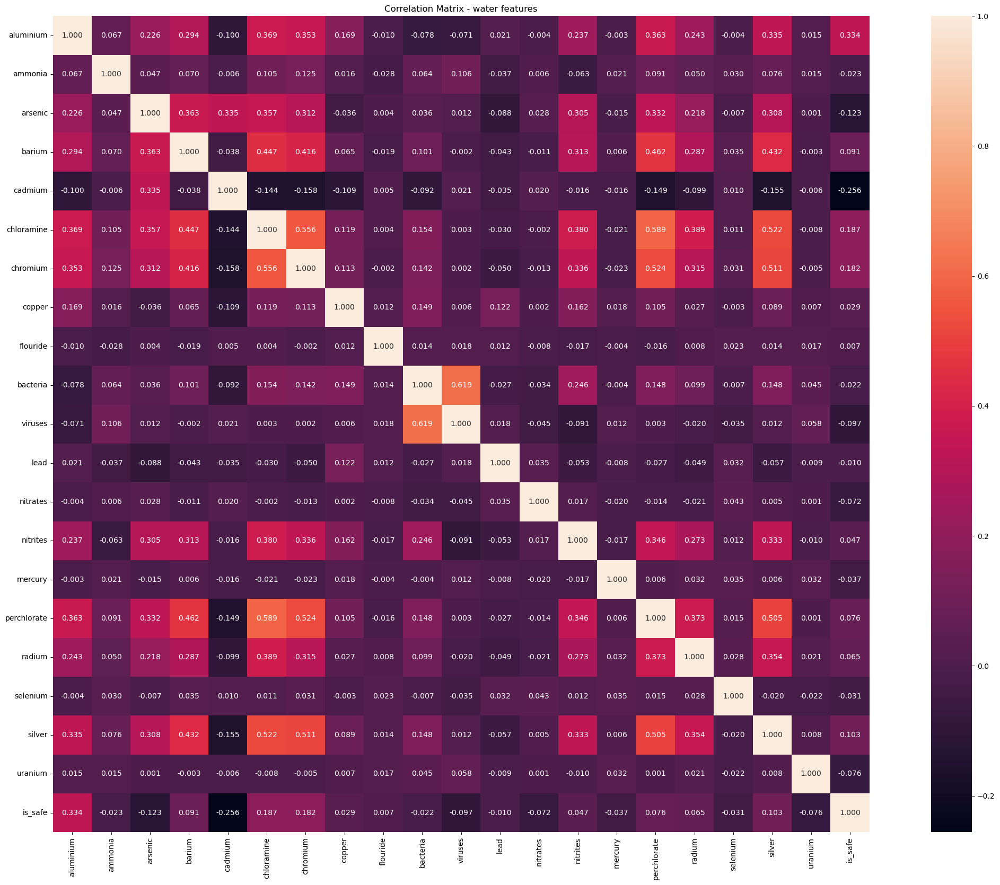

In [28]:
# describe dataset
display(water.describe())

#change fig size 
plt.figure(figsize= (30,20))

#explore the correlation of the variables
water_corr = water.corr()
water_heatmap = sns.heatmap(
    data = water_corr,
    square=True,
    annot=True,
    fmt= ".3f"
)
water_heatmap.set_title("Correlation Matrix - water features")
water_heatmap.plot();

The Heatmap is very big and therefore hard to interpret. However, roughly speaking the correlation with one another is the greatest for the following: 
- chromium & silver
- chloramine & silver
- chromium & chloramine
- perchlorate & chloramine
- perchlorate & chromium 
- perchlorate & silver
- perchlorate & barium
- bacteria & viruses


- Create a pairplot including the columns "arsenic", "cadmium", "chromium", "copper", "bacteria", "viruses", "lead", "nitrates", "mercury"; and color by the class "is_safe" **1 points**

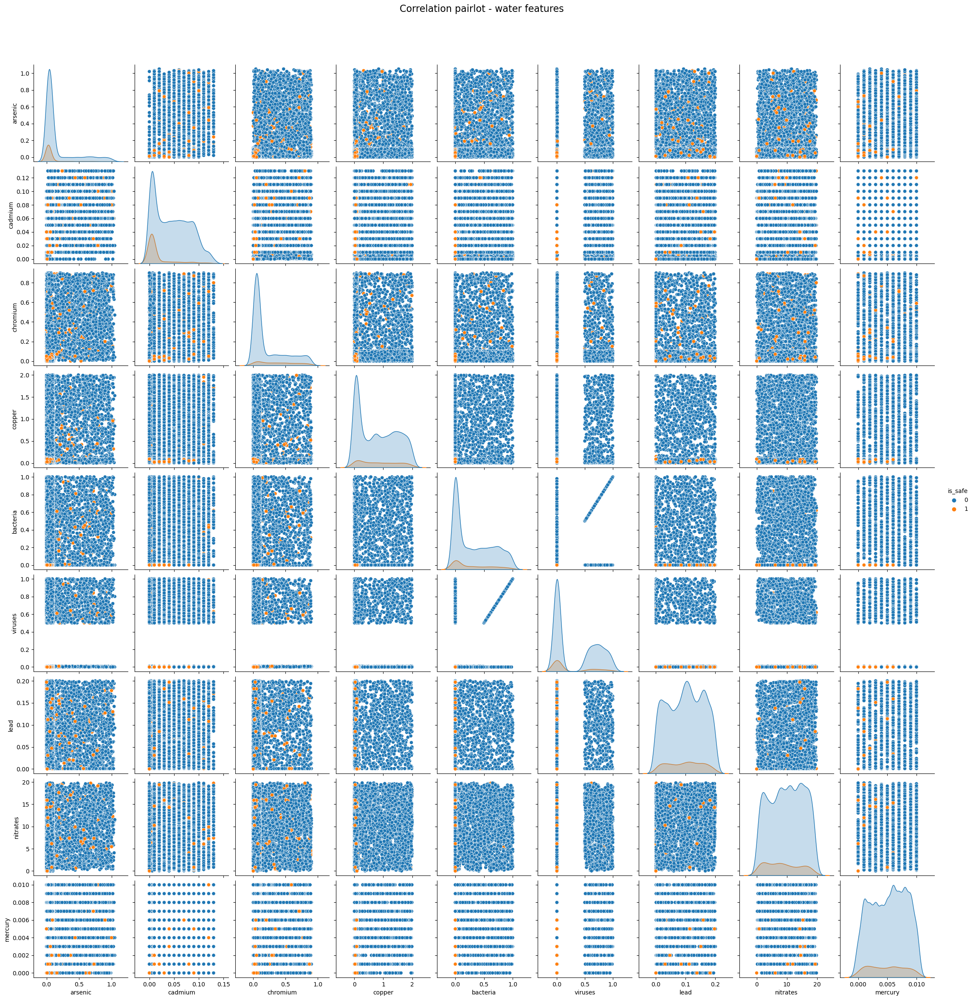

In [29]:
#display pairplot 
water_selected = water.loc[:,["arsenic", "cadmium", "chromium", "copper", "bacteria", "viruses", "lead", "nitrates", "mercury","is_safe"]]
water_pairplot = sns.pairplot(water_selected,
                          hue = "is_safe")
plt.suptitle("Correlation pairlot - water features", fontsize = 16, y= 1.05)
plt.show()

- Feel free to pursue your exploration to better understand your dataset. Although not graded, this might help you better understanding the problem and answer the following questions.

Next up, I will select one of the relationships from above to get a better understanding on how to read the correlations in the big pairplot. 

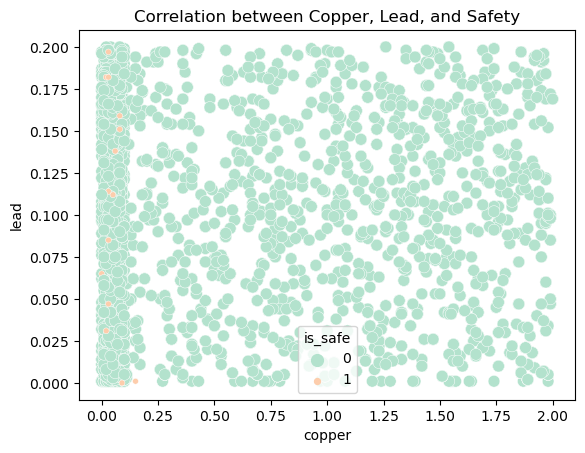

In [30]:
#choosing some features from the selected water dataset to explore in more depth

water_scatter = sns.scatterplot(
    data = water_selected, 
    palette= "Pastel2",
    x = "copper",
    y= "lead",
    hue= "is_safe", 
    size = "is_safe",
    legend = "auto"
)
water_scatter.set_title("Correlation between Copper, Lead, and Safety")
water_scatter.plot();

This graph shows the relationship between Copper, Lead and Safety. The Scatterplot indicates that water samples are more likely to be ranked as "safe", if there is no/very low level of copper in the water sample, while the lead content does not have such a clear impact on the water safety, since there are also safe samples with increasing lead content.

Lastly, I will take a look on a boxplot, checking if we can observe a trend between the different water features.

In [31]:
# boxplot for the saftey class "safe =1" versus "not safe = 0"
#grouping the dataset
water_grouped = water_selected.groupby("is_safe").count()
display(water_grouped)
print("The class %s has %d observations." %(water_grouped.index[0],water_grouped.iloc[0,0]))
print("The class %s has %d observations." %(water_grouped.index[1],water_grouped.iloc[1,0]))

#scale and fit my features for a more representable graph
scaler = MinMaxScaler()
water_scaled = scaler.fit_transform(water_selected)
#display(water_scaled)
#create a new panda frame with the scaled data
comparing_water = pd.DataFrame(water_scaled)

#rename headers
header= ["arsenic", "cadmium", "chromium", "copper", "bacteria", "viruses", "lead", "nitrates", "mercury","is_safe"]
comparing_water.columns = header
display(comparing_water)


#plot boxplot
box_water = px.box(
    data_frame = comparing_water,
    y = ["arsenic", "cadmium", "chromium", "copper", "bacteria", "viruses", "lead", "nitrates", "mercury"],
    points = "all",
    title= "Impact of features on Safety",
    color= "is_safe",
    labels= {"is_safe": "Safety"}
)
box_water


,arsenic,cadmium,chromium,copper,bacteria,viruses,lead,nitrates,mercury
is_safe,,,,,,,,,
0,7084,7084,7084,7084,7084,7084,7084,7084,7084
1,912,912,912,912,912,912,912,912,912


The class 0 has 7084 observations.
The class 1 has 912 observations.


,arsenic,cadmium,chromium,copper,bacteria,viruses,lead,nitrates,mercury,is_safe
0,0.038095,0.053846,0.922222,0.085,0.20,0.000,0.270,0.810893,0.7,1.0
1,0.009524,0.015385,0.755556,0.330,0.65,0.650,0.500,0.101362,0.3,1.0
2,0.038095,0.061538,0.588889,0.010,0.05,0.003,0.390,0.714070,0.6,0.0
3,0.038095,0.007692,0.033333,0.830,0.71,0.710,0.080,0.071104,0.4,1.0
4,0.028571,0.046154,0.766667,0.285,0.13,0.001,0.585,0.339889,0.3,1.0
...,...,...,...,...,...,...,...,...,...,...
7991,0.000000,0.307692,0.033333,0.015,0.00,0.000,0.985,0.720625,0.5,1.0
7992,0.019048,0.076923,0.022222,0.010,0.00,0.000,0.155,0.517902,0.1,1.0
7993,0.000000,0.230769,0.055556,0.010,0.00,0.000,0.910,0.802824,0.0,1.0
7994,0.009524,0.000000,0.000000,0.045,0.00,0.000,0.000,0.000000,0.0,1.0


After rescaling our data, the variables range from 0 to 1, which makes it easier to compare within one plot. The box plot shows that for many variables, not safe observations (Class 0) and safe observations have very close medians, however the max value is slightly above the "safe" observation counterpart. Some outstanding features are:
- Chromium since the median and max value for safe observations is higher than for unsafe ones-> this can be interpreted as that higher levels of Chromium are often categorized as safe.
- Cadmium, since the median and max value for safe observations is significantly lower than for unsafe ones -> this can be interpreted as that higher levels of Cadmium are often categorized as unsafe.

### Question 7: Preprocessing

We will try to predict the class "is_safe", using all the other features.

- Extract your features and outcome. How many observations do we have of class 0 and of class 1? **1 point**

In [32]:
X = water.drop(columns="is_safe")
y = water["is_safe"]

observations = pd.DataFrame({"Class 0": [y.value_counts()[0]], 
                            "Class 1": [y.value_counts()[1]]})
display(observations)
print("There are %g observations of class %g." %(y.value_counts()[0], y.value_counts().index[0]))
print("There are %g observations of class %g." %(y.value_counts()[1], y.value_counts().index[1]))

,Class 0,Class 1
0,7084,912


There are 7084 observations of class 0.
There are 912 observations of class 1.


When classifying our dataset in "safe" and "not safe" observations we get a quite unbalanced dataset. There are many more observations for the class 0, which indicates that the water samples are "not safe". On the other hand, class 1 represents water samples that were ranked as "safe". 

- Split between training and test set **1 point**

*Note*: Use as parameters for splitting: `test_size=0.2`, `random_state=39`, `shuffle=True`

In [33]:
#split my data set into 80% train and 20% test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=39, shuffle=True)
#display # of obesrvations for train versus test data
print("The training set has %g observations, while the test set has %g observations." %(len(X_train),len(X_test)))

The training set has 6396 observations, while the test set has 1600 observations.


- Rescale your features using `StandardScaler` **1 point**

In [34]:
# define scaler
scaler = StandardScaler()

#rescale my  test and train dataset
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

### Question 8: Logistic Regression

- Build and train a logistic regression classifier, using as parameters `penalty='l2'`, `solver='lbfgs'`, `max_iter=1000` **1 point**

In [35]:
# create model (logistic regression classifier)
model_lg = LogisticRegression(penalty="l2", solver="lbfgs", max_iter=1000)

model_lg.fit(X_train,y_train.values.flatten())

#display coefficients of logistic regression model
model_coeff = pd.DataFrame(model_lg.coef_.flatten(), 
                     index = list(water.columns.values[:-1]),
                     columns=['Coefficients Logistic Regression model'])
model_coeff


,Coefficients Logistic Regression model
aluminium,0.894668
ammonia,-0.215239
arsenic,-0.678496
barium,0.184931
cadmium,-0.751893
chloramine,0.446374
chromium,0.306908
copper,-0.224668
flouride,0.077818
bacteria,0.259745


- Compute the accuracy on the training and test set. Compare it to the default rate. **1 point** 

- What is the precision, recall, and f1 score of class 1? Interpret the result. **1 point**

In [36]:
# Formula that calculates the accuracy (test and train), default rate, precision, recall and F1
def Classifier_stats (model, dataset, category, X_test,X_train, y_test, y_train,column_name):
    y_pred = model.predict(X_test)
    accuracy_train = accuracy_score(y_train, model.predict(X_train))
    accuracy_test = accuracy_score(y_test, y_pred)
    defaultrate = max(len(dataset.loc[dataset[category] ==0]),len(dataset.loc[dataset[category] == 1]))/len(dataset[category])
    precision = precision_score(y_test,y_pred)
    recall = recall_score(y_test,y_pred)
    f1 = f1_score(y_test,y_pred)

    data = {"Train accuracy": [accuracy_train], 
            "Test accuracy":[accuracy_test],
            "Defaultrate":[defaultrate],
            "Precision (Class 1)":[precision],
            "Recall (Class 1)":[recall],
            "F1 (Class 1)":[f1]}
    stats = pd.DataFrame(data).T

    stats = stats.rename(columns={0:column_name})
    
    return(stats)


In [37]:
Logisticreg = Classifier_stats(model_lg, water, "is_safe", X_test, X_train, y_test, y_train, "Logistic_Reg")
Logisticreg

,Logistic_Reg
Train accuracy,0.905879
Test accuracy,0.910625
Defaultrate,0.885943
Precision (Class 1),0.720000
Recall (Class 1),0.306818
F1 (Class 1),0.430279


**Interpretation:**

1. **Comparison of accuracy and default rate:** The accuracy of the test set is ~91% and with that slightly better than the accuracy of the training model. It states that the Logistic regression model is to ~91% right to correctly to classify water samples in safe or unsafe categories. The default rate of the model is ~89%, which is very high showing us that we have a very unbalanced data for one category. Since the default rate is lower than the accuracy, the logistic regression improves the model.
2. **Interpret Precision, Recall, F1:** In general, between Precision and Recall there is a trade off, when I improve my precision, the recall reduces. 
    - **Precision (# of true safe observations / # of predicted safe observations):** Here, the model was to ~72% correct when predicting true, meaning predicted safe water observations were classified as such. Having only a score of 72% here can be dangerous, since almost ever 3rd water sample that is actually not safe is classified as safe!
    - **Recall (# of true safe observations / # of actual safe observations):** The model got ~31% of the safe observations correct, which is not very good!
    - **F1:** This can range from 0 to 1, where 1 is the optimal outcome only able to reach when Precision and Recall reach 1.  It brings together the recall and the precision score to evaluate the model's overall performance. With a score of 43% the model must be further improved.


- Plot a heatmap of the confusion matrix. Class 1 is the positive class. How many false positive did we obtain? **1 point**

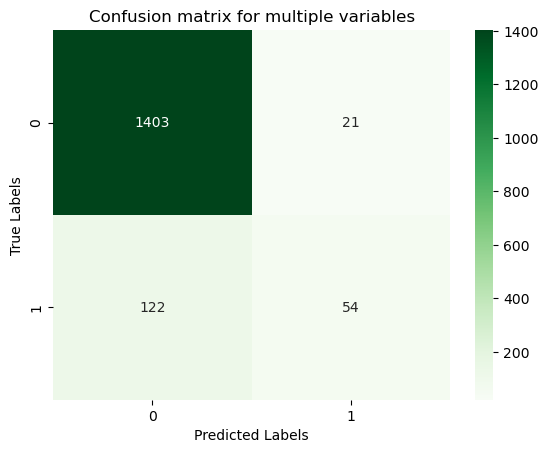

In [38]:
#predict results
y_pred = model_lg.predict(X_test)

#plot confusion matrix
CM_water = confusion_matrix(y_test,y_pred)

CM_water_heatmap = sns.heatmap(
    data = CM_water,
    annot = True,
    cmap= "Greens",
    fmt = ".4g"
)
plt.ylabel("True Labels")
plt.xlabel("Predicted Labels")
plt.title("Confusion matrix for multiple variables");

We obtain 21 False Positives (FP), meaning class 1 was predicted, however they are actual categorized as class 0. 

- Build and train a logistic regression classifier with cross-validation, using 5 folds **1 point**

In [39]:
# 
logistic_cv_model = LogisticRegressionCV(penalty='l2', solver='lbfgs', cv=5, max_iter=1000, fit_intercept=False)

#fit the paramters
logistic_cv_model.fit(X_train, y_train)

#check the score accuracy
print(f"The Accuracy score of the crossvalidation on train data with the Logistic Regression is: {round(logistic_cv_model.score(X_train, y_train),3)}")

#printing the coefficients of the linear model
model_coeff["Coefficients Logistic Regression CV model"] = logistic_cv_model.coef_.flatten()
model_coeff


The Accuracy score of the crossvalidation on train data with the Logistic Regression is: 0.689


,Coefficients Logistic Regression model,Coefficients Logistic Regression CV model
aluminium,0.894668,0.528379
ammonia,-0.215239,-0.065160
arsenic,-0.678496,-0.249747
barium,0.184931,0.065459
cadmium,-0.751893,-0.209815
chloramine,0.446374,0.220806
chromium,0.306908,0.141497
copper,-0.224668,-0.087923
flouride,0.077818,0.023295
bacteria,0.259745,0.113587


- Plot a heatmap of the confusion matrix. Compute the accuracy on the training and test set; as well as the precision, recall, and f1 score of class 1. How do your metrics compare to your model without cross-validation? **1 point**

*Note*: You can, but not have to, create a function to calculate your evaluation metrics since we will perform the same operation later on.

In [40]:
#update the function which calculates the stats and plots a confusion matrix for the given data and model
def Classifier_stats_heatmap (model, dataset, category, X_test,X_train, y_test, y_train, column_name):
    y_pred = model.predict(X_test)
    accuracy_train = accuracy_score(y_train, model.predict(X_train))
    accuracy_test = accuracy_score(y_test, y_pred)
    defaultrate = max(len(dataset.loc[dataset[category] ==0]),len(dataset.loc[dataset[category] == 1]))/len(dataset[category])
    precision = precision_score(y_test,y_pred)
    recall = recall_score(y_test,y_pred)
    f1 = f1_score(y_test,y_pred)

    data = {"Train accuracy": [accuracy_train], 
            "Test accuracy":[accuracy_test],
            "Defaultrate":[defaultrate],
            "Precision (Class 1)":[precision],
            "Recall (Class 1)":[recall],
            "F1 (Class 1)":[f1]}
    stats = pd.DataFrame(data).T

    stats = stats.rename(columns={0:column_name})
    
    CM = confusion_matrix(y_test,y_pred)

    sns.heatmap(
    data = CM,
    annot = True,
    cmap= "Greens",
    fmt = ".4g")

    plt.ylabel("True Labels")
    plt.xlabel("Predicted Labels")
    plt.title("Confusion matrix");

    return (stats)


,Logistic_Reg,Logistic_reg_CV
Train accuracy,0.905879,0.688712
Test accuracy,0.910625,0.694375
Defaultrate,0.885943,0.885943
Precision (Class 1),0.720000,0.242175
Recall (Class 1),0.306818,0.835227
F1 (Class 1),0.430279,0.375479


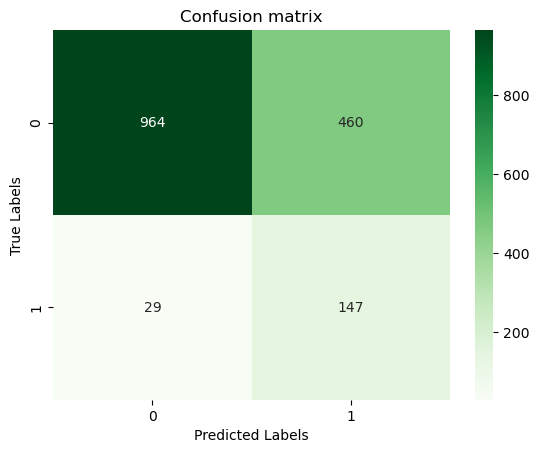

In [41]:
Logistic_reg_CV = Classifier_stats_heatmap(logistic_cv_model, water, "is_safe",X_test,X_train, y_test, y_train, "Logistic_reg_CV")
#print(Logistic_reg_CV)
multi_stats = pd.concat([Logisticreg, Logistic_reg_CV], axis=1)
display(multi_stats)

**Interpretation:**

1. **Comparison of accuracy and default rate:** The accuracy of the training and the test set is ~69%. Compared to the Logistic Model without Cross validation, the accuracy decreased by over 20% and now lies below the the default rate with ~89%. Therefore, the model is very bad now.
2. **Interpret Precision, Recall, F1:** As mentioned before the Recall and the Precision are trade offs to one another.
    - **Precision (# of true safe observations / # of predicted safe observations):** Now the precision dropped to 24%, which is much more dangerous than before since now 3 out of 4 water samples that are categorized as safe are actually unsafe, which can lead to health and other faulty conclusions.
    - **Recall (# of true safe observations / # of actual safe observations):** The recall score improved by jumping to 83%, Now the model gets 83% of the safe observations correct, which is better however it comes on the expense of the Precision.
    - **F1:** The overall performance of the model reduced to ~37%, and therefore no option to keep this model.

### Question 9: KNN classifier

- Build and train a KNN classifier with parameters `n_neighbors=7`, `p=2`, `weights='uniform'` **1 point**

In [42]:
# set up kNeighbour model
model_knn = KNeighborsClassifier(n_neighbors=7, p=2, weights= "uniform")

#fit our model
model_knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=7)

- Plot a heatmap of the confusion matrix. Compute the accuracy on the training and test set; as well as the precision, recall, and f1 score of class 1. How do your metrics compare to your previous models? **1 point**

,Logistic_Reg,Logistic_reg_CV,KNN_Classifier
Train accuracy,0.905879,0.688712,0.932458
Test accuracy,0.910625,0.694375,0.918750
Defaultrate,0.885943,0.885943,0.885943
Precision (Class 1),0.720000,0.242175,0.773810
Recall (Class 1),0.306818,0.835227,0.369318
F1 (Class 1),0.430279,0.375479,0.500000


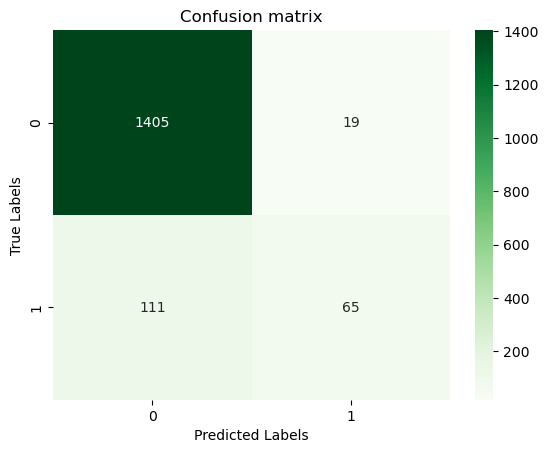

In [43]:
# YOUR CODE HERE
knn_classifier = Classifier_stats_heatmap(model_knn, water, "is_safe",X_test,X_train, y_test, y_train, "KNN_Classifier")
multi_stats = pd.concat([multi_stats, knn_classifier], axis=1)
display(multi_stats)

**Interpretation:**

1. **Comparison of accuracy and default rate:** The accuracy of the training and the test set is ~92%. The train accuracy is slightly better than the test set ones by 1.5% points and therefore might be an indicator for overfitting.
2. **Interpret Precision, Recall, F1:** This model is more similar to the simple Linear Regression, however the scores improved in comparison.
    - **Precision (# of true safe observations / # of predicted safe observations):** The precision increased to 77%, and with that this is the most accurate model in regards of categorizing only safe samples as safe.
    - **Recall (# of true safe observations / # of actual safe observations):** Compared to the Linear Regression model, also the recall improved from ~31% to ~37%. Now the model gets 37% of the safe observations correct, which is however still quite low.
    - **F1:** The overall performance of the model improved to 50% and with that is our best option so far.

- Use `GridSearchCV` to explore different parameters for your model: `n_neighbors` between 1 and 11, `p` between 1 and 3, and `weights` either 'uniform' or 'distance' **1 point**

In [44]:
# define parameters
grid = {"n_neighbors":np.arange(1,12),
        "p":np.arange(1,3),
        "weights": ["uniform","distance"]
}

#define and fit the model
knn = KNeighborsClassifier()
model_knn_cv = GridSearchCV(knn, grid, cv=5)
model_knn_cv.fit(X_train, y_train)

# Print results
print("Hyperparameters:", model_knn_cv.best_params_)
print("Train Score: {:0.2f}".format(model_knn_cv.best_score_))
print("Test Score: {:0.2f}".format(model_knn_cv.score(X_test, y_test)))

Hyperparameters: {'n_neighbors': 9, 'p': 2, 'weights': 'uniform'}
Train Score: 0.91
Test Score: 0.92


- For your "optimal" model, compute the accuracy on the training and test set; as well as the precision, recall, and f1 score of class 1. How do your metrics compare to your previous models? **1 point** 

,Logistic_Reg,Logistic_reg_CV,KNN_Classifier,KNN_Classifier_OPT
Train accuracy,0.905879,0.688712,0.932458,0.928080
Test accuracy,0.910625,0.694375,0.918750,0.923125
Defaultrate,0.885943,0.885943,0.885943,0.885943
Precision (Class 1),0.720000,0.242175,0.773810,0.844156
Recall (Class 1),0.306818,0.835227,0.369318,0.369318
F1 (Class 1),0.430279,0.375479,0.500000,0.513834


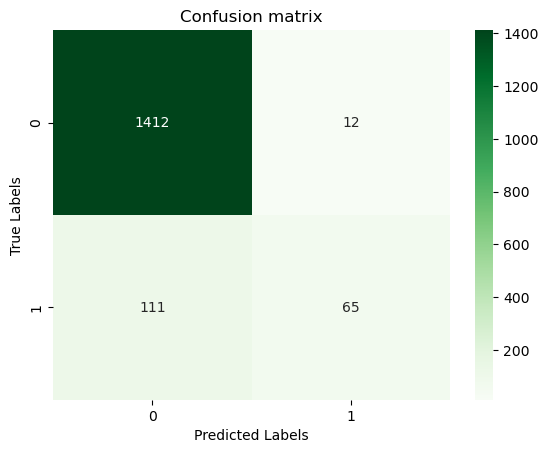

In [45]:
# set up the best calculated knn parameters
model_knn_opt = KNeighborsClassifier(n_neighbors=9, p=2, weights= "uniform")

#fit our model
model_knn_opt.fit(X_train, y_train)

#calculate the "optimal" stats
knn_classifier_opt = Classifier_stats_heatmap(model_knn_opt, water, "is_safe",X_test,X_train, y_test, y_train,"KNN_Classifier_OPT" )
multi_stats = pd.concat([multi_stats, knn_classifier_opt], axis=1)
display(multi_stats)

**Interpretation:**

1. **Comparison of accuracy and default rate:** The accuracy of the training and the test set of the optimal knn classifier is ~92.5% and with that very similar to the previous knn model where we chose to take only 7 neighbours into account, compared to 9 neighbours - for our optimal model.
2. **Interpret Precision, Recall, F1:** This model plays with the parameters of the knn model and is therefore very similar, however it improved the previous knn classifier results.
    - **Precision (# of true safe observations / # of predicted safe observations):** The precision increased from 77% to 84%. This is a great increase, since it means that in comparison this model reduces false positives to 16%. This indicates a "safer" result since out of all the positive predictions, 84% were actually safe water samples.
    - **Recall (# of true safe observations / # of actual safe observations):** Compared to the other knn classifier model, the recall score stayed the same at 37%. This is a good improvement, since we were able to increase the precision without having a tradeoff on the recall score.
    - **F1:** The overall performance of the model improved from 50% to 51% and with that is our best model so far.

### Question 10: Decision Trees

- Build and train a Decision Tree with parameters `criterion = 'gini'`, `max_depth = 3` **1 point**

In [46]:
# build decision tree model
model_tree = DecisionTreeClassifier(criterion = "gini", max_depth = 3)

#fit the model
model_tree.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3)

- Plot a heatmap of the confusion matrix. Compute the accuracy on the training and test set; as well as the precision, recall, and f1 score of class 1. How do your metrics compare to your previous models? **1 point**

,Logistic_Reg,Logistic_reg_CV,KNN_Classifier,KNN_Classifier_OPT,Decision_Tree
Train accuracy,0.905879,0.688712,0.932458,0.928080,0.940588
Test accuracy,0.910625,0.694375,0.918750,0.923125,0.941875
Defaultrate,0.885943,0.885943,0.885943,0.885943,0.885943
Precision (Class 1),0.720000,0.242175,0.773810,0.844156,0.910891
Recall (Class 1),0.306818,0.835227,0.369318,0.369318,0.522727
F1 (Class 1),0.430279,0.375479,0.500000,0.513834,0.664260


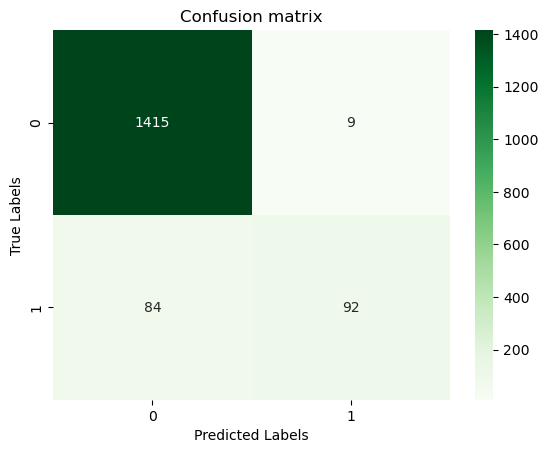

In [47]:
#tree model stats
tree_classifier = Classifier_stats_heatmap(model_tree, water, "is_safe",X_test,X_train, y_test, y_train, "Decision_Tree")
multi_stats = pd.concat([multi_stats, tree_classifier], axis=1)
display(multi_stats)

**Interpretation:**

1. **Comparison of accuracy and default rate:** The accuracy of the training and the test set of the decision tree model increased to ~94%. Even though decision trees are prone to overfitting, this result shows very similar results for the train ad the test accuracy and therefore doesn't indicate a too complex Decision Tree structure.
2. **Interpret Precision, Recall, F1:** This decision tree model calculates the Gini Index  on each node, which represents the wealth inequality within the water samples. In addition, for this model we choose a maximal depth of 3, meaning that there are 3 downward layers, therefore this model restricts the depths and is likely to counteract overfitting since not all leaves will be pure on the bottom layer.
    - **Precision (# of true safe observations / # of predicted safe observations):** Compared to the optimal knn model, the precision increased from 84% to 91%. This is a positive increase, since more samples from the False Positives were moved to the True Positive category.
    - **Recall (# of true safe observations / # of actual safe observations):** Also the recall improved from 37% to 52% compared to teh knn optimal classifier. The Confusion Matrix shows that 27 samples shifted from False Negatives to True Positives.
    - **F1:** The overall performance of the model improved from 51% to 66% and with that made a significant increase in the model's performance.


- Visualize your Decision Tree **1 point**

C:\Users\Charlotte Ahrens\AppData\Local\Temp\ipykernel_5552\2768743791.py:4: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



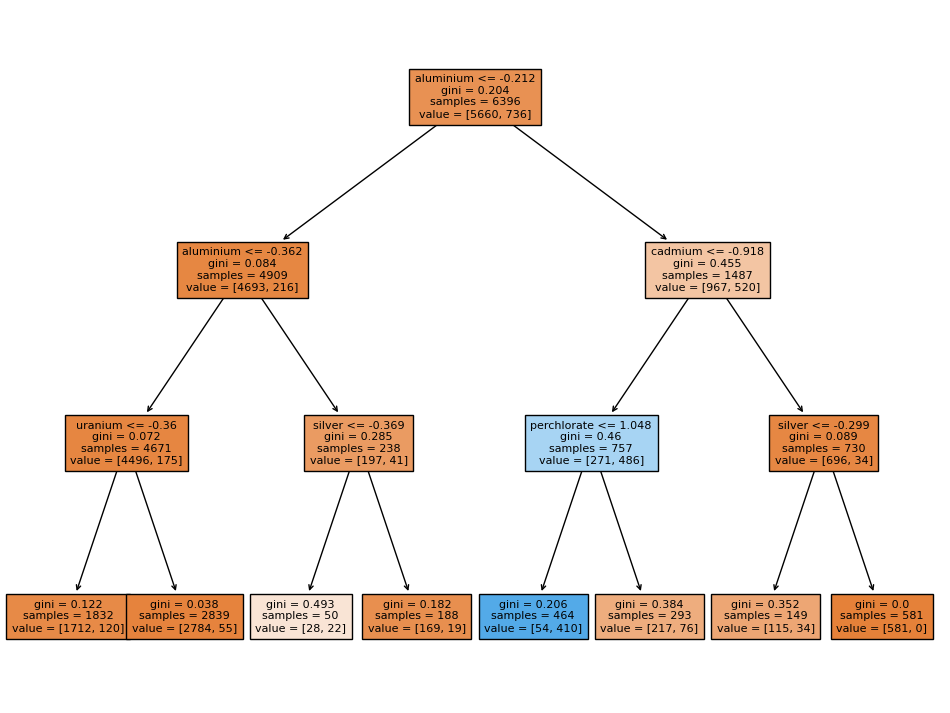

In [48]:
#plot the tree
water_tree = plt.figure(figsize=(12,9))
plot_tree(model_tree, filled= True, feature_names=(water.columns.values[:-1]), fontsize= 8, label="all")
water_tree.show()

- Use `GridSearchCV` to explore different parameters for your model: `criterion` either 'gini' or 'entropy' and `max_depth` between 1 and 7 **1 point**

In [49]:
#define parameters that I want to test
grid_tree = {"criterion": ["gini","entropy"],
             "max_depth":np.arange(1,7)}

#define the model
tree = DecisionTreeClassifier()
tree_cv = GridSearchCV(tree, grid_tree, cv=5)
#fit the model
tree_cv.fit(X_train, y_train)

#get results
print("Hyperparameters:", tree_cv.best_params_)
print("Best model:", tree_cv.best_estimator_)

Hyperparameters: {'criterion': 'entropy', 'max_depth': 6}
Best model: DecisionTreeClassifier(criterion='entropy', max_depth=6)


- For your "optimal" model, compute the accuracy on the training and test set; as well as the precision, recall, and f1 score of class 1. How do your metrics compare to your previous models? **1 point** 

,Logistic_Reg,Logistic_reg_CV,KNN_Classifier,KNN_Classifier_OPT,Decision_Tree,Decision_Tree_OPT
Train accuracy,0.905879,0.688712,0.932458,0.928080,0.940588,0.967636
Test accuracy,0.910625,0.694375,0.918750,0.923125,0.941875,0.959375
Defaultrate,0.885943,0.885943,0.885943,0.885943,0.885943,0.885943
Precision (Class 1),0.720000,0.242175,0.773810,0.844156,0.910891,0.923664
Recall (Class 1),0.306818,0.835227,0.369318,0.369318,0.522727,0.687500
F1 (Class 1),0.430279,0.375479,0.500000,0.513834,0.664260,0.788274


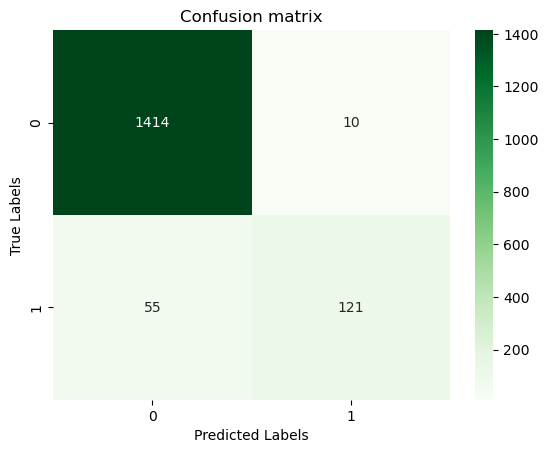

In [50]:
# set up optimal decision tree model 
model_tree_opt = DecisionTreeClassifier(criterion="entropy", max_depth= 6)

# fit the model
model_tree_opt.fit(X_train, y_train)

# calcualte optimal stats
tree_classifier_opt = Classifier_stats_heatmap(model_tree_opt, water, "is_safe",X_test,X_train, y_test, y_train, "Decision_Tree_OPT" )
multi_stats = pd.concat([multi_stats, tree_classifier_opt], axis=1)
display(multi_stats)

**Interpretation:**

1. **Comparison of accuracy and default rate:** The accuracy of the training and the test set of the decision tree model increased to ~96%.
2. **Interpret Precision, Recall, F1:** The parameters for the optimized decision tree model are "entropy" and a max depth of 6. Entropy is another way of measuring the Information Gain of the model. The Information gain quantifies the size of uncertainty, meaning we measure the level of impurity with the goal of decreasing the value of entropy. In addition, we increase the maximal depth of the decision tree, which normally improves the model since it has more downward nodes to put criteria in order to classify the data further.
    - **Precision (# of true safe observations / # of predicted safe observations):** With these new parameters the precision slightly improves from 91% to 93%. Even though the observation ranked as False Positives stayed the same, we are getting a better score, since the category of the True positives increased by 29 observations.
    - **Recall (# of true safe observations / # of actual safe observations):** For the recall, we are observing a significant increase/improvement from 52% to 69%. The confusion matrix shows that 29 observations moved from False Negatives to True Positives.
    - **F1:** The overall performance further improved from 66% to 79% and with that it is the best model for the dataset in order to categorize the water samples into their right classes safe versus unsafe.

Congrats, you are done with the assignment! YAY